# Whelks and lobsters -- context operator

## The system

In [1]:
R.<x,y> = QQ[]

In [2]:
from lbuc import *

In [3]:
us = [x,y]
k=RIF(0.8); b=RIF(0.6); c=RIF(0.3); e=RIF(0.05); f=RIF(2)
vf = vector([b*x*(RIF(1)-x) - c*x*(k-x)*y,
            -e*y*(RIF(1)+y)+f*x*(k-x)*y])
v0 = [RIF(0.5), RIF(2.0)]
v1 = [RIF(0.4), RIF(2.5)]
v2 = [RIF(1,1.2), RIF(4,6)]

In [4]:
v3 = v2 # [RIF(1,1.1), RIF(4,5)]

In [5]:
Poly(y).var_names

['x', 'y']

In [6]:
Poly(x)

var_names = [b'local_t', b'x', b'y']
res = b'(([1.0000000000 , 1.0000000000] * x))'


(([1.0000000000 , 1.0000000000] * x))

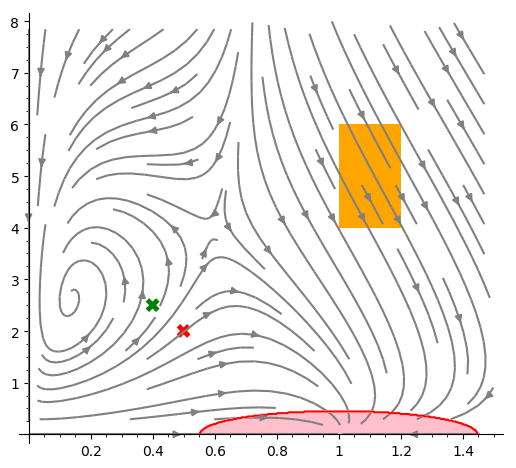

In [7]:
p = streamline_plot(tuple(vf),(x,0,1.5),(y,0,8), color='grey')\
    + point(v0, size=100, marker='X', color='red')\
    + point(v1, size=100, marker='X', color='green')\
    + polygon([(v3[0].lower(), v3[1].lower()),
               (v3[0].lower(), v3[1].upper()),
               (v3[0].upper(), v3[1].upper()),
               (v3[0].upper(), v3[1].lower())],
              color='orange')\
    + region_plot((lambda x, y: (x - 1)^2 + y^2 - 0.2 < 0),
                  (x, 0, 1.5),
                  (y, 0, 8),
                  incol='pink', plot_points=500, bordercol='red')
p.set_aspect_ratio(1/6)
p.show()

## Simple signal

In [8]:
P = Atomic((x - 1)^2 + y^2 - 0.2 > 0)

Precomposed systems in 1.4781951904296875e-05 sec
calling reach with y0 = ['[1.0000000000000000 .. 1.2000000000000000]', '[4.0000000000000000 .. 6.0000000000000000]']
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [1.0..1.2]
C = [4.0..6.0]
Computed 116 flowpipes in 1.149228811264038 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd2c48c940>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=True, tentative_unpreconditioning=True, mask=Mask([0.0000000000000000 .. 5.2010000000000006], [[0.10000000000000000 .. 5.2010000000000006]]))
symbolic_composition=True, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.74295457113491081 .. 2.3821495701276457]]
doma

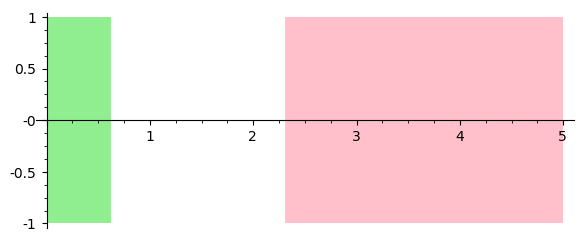

In [9]:
sig = F(RIF(0.1, 0.2), P).signal_for_system(
    vf, v3, 5, order=5, step=(0.01, 0.2),
    precondition=1,
    estimation=1e-3,
    integrationScheme=2,
    cutoff_threshold=1e-5,
    symbolic_composition=True,
    use_masks=True,
)
sig.plot()

calling reach with y0 = ['[1.0000000000000000 .. 1.2000000000000000]', '[4.0000000000000000 .. 6.0000000000000000]']
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [1.0..1.2]
C = [4.0..6.0]
contexts = ['[1.0..1.2]', '[4.0..6.0]']
statics  = []
Computed 116 flowpipes in 5.0067901611328125e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd2c406220>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=True, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.20

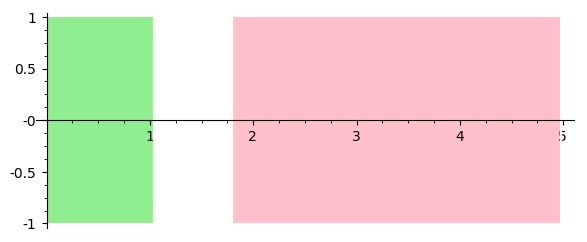

In [10]:
csig = F(RIF(0.1, 0.2), P).context_signal_for_system(
    vf, v3, 5, order=5, step=(0.01, 0.2),
    precondition=1,
    estimation=1e-3,
    integrationScheme=2,
    cutoff_threshold=1e-5,
    symbolic_composition=True,
    use_masks=False,
)
sig = csig.refined_signal(2)
sig.plot()

self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2c406220>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] *

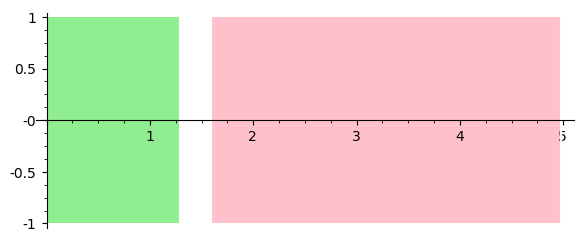

In [11]:
sig = csig.refined_signal(4)
sig.plot()

Precomposed systems in 1.4543533325195312e-05 sec
calling reach with y0 = ['[1.0000000000000000 .. 1.2000000000000000]', '[4.0000000000000000 .. 6.0000000000000000]']
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [1.0..1.2]
C = [4.0..6.0]
Computed 116 flowpipes in 1.087677240371704 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd2ef14b60>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=True, tentative_unpreconditioning=True, mask=Mask([0.0000000000000000 .. 5.2000000000000002], [[0.59999999999999997 .. 1.2000000000000002], [3.0999999999999996 .. 4.2000000000000002]]))
symbolic_composition=True, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.74

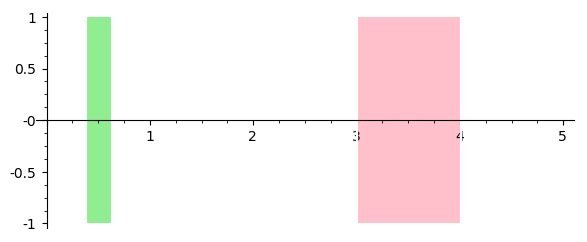

In [12]:
sig = F(RIF(0.1, 0.2), P).signal_for_system(
    vf, v3, 5, order=5, step=(0.01, 0.2),
    precondition=1,
    estimation=1e-3,
    integrationScheme=2,
    cutoff_threshold=1e-5,
    symbolic_composition=True,
    use_masks=True,
    mask=Mask(RIF(0, 5), [RIF(0.5, 1), RIF(3, 4)]),
)
sig.plot()

Precomposed systems in 8.821487426757812e-06 sec
calling reach with y0 = ['[1.0000000000000000 .. 1.2000000000000000]', '[4.0000000000000000 .. 6.0000000000000000]']
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [1.0..1.2]
C = [4.0..6.0]
Computed 115 flowpipes in 1.2856132984161377 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd2eeeae60>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=True, tentative_unpreconditioning=True, mask=Mask([0.0000000000000000 .. 5.0010000000000004], [[0.0000000000000000 .. 5.0010000000000004]]))
symbolic_composition=True, tentative_unpreconditioning=True
roots(space_domain=None, epsilon=1e-05, verbosity=0)
roots = [[0.74295457113491081 .. 2.3821495701276457]]
domai

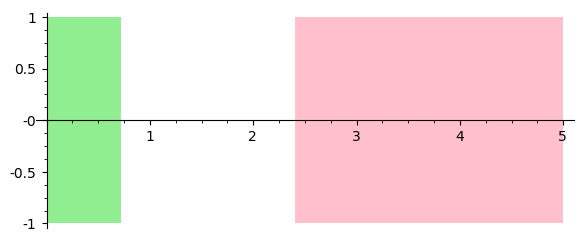

In [13]:
sig = P.signal_for_system(
    vf, v3, 5, order=5, step=(0.01, 0.2),
    precondition=1,
    estimation=1e-3,
    integrationScheme=2,
    cutoff_threshold=1e-5,
    symbolic_composition=True,
    use_masks=True,
)
sig.plot()

In [14]:
P

Atomic(x^2 + y^2 - 2.00000000000000*x + 0.800000000000000)

calling reach with y0 = ['[1.0000000000000000 .. 1.2000000000000000]', '[4.0000000000000000 .. 6.0000000000000000]']
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [1.0..1.2]
C = [4.0..6.0]
contexts = ['[1.0..1.2]', '[4.0..6.0]']
statics  = []
Computed 115 flowpipes in 5.9604644775390625e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd2f23b0d0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=True, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.20

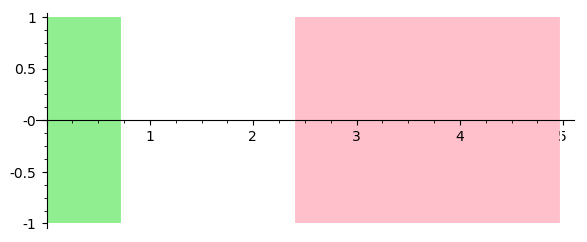

In [15]:
ctx_sig = P.context_signal_for_system(
    vf, v3, 5, order=5, step=(0.01, 0.2),
    precondition=1,
    estimation=1e-3,
    integrationScheme=2,
    cutoff_threshold=1e-5,
    symbolic_composition=True,
    use_masks=True,
)
ctx_sig.signal.plot()

self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2f23b0d0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] *

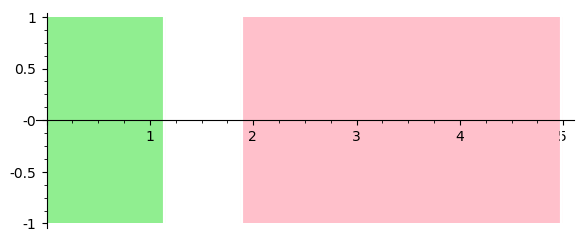

In [16]:
ctx_sig.refined_signal(2).plot()

calling reach with y0 = ['[1.0000000000000000 .. 1.2000000000000000]', '[4.0000000000000000 .. 6.0000000000000000]']
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [1.0..1.2]
C = [4.0..6.0]
contexts = ['[1.0..1.2]', '[4.0..6.0]']
statics  = []
Computed 116 flowpipes in 5.7220458984375e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd2f7725c0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=True, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.20000

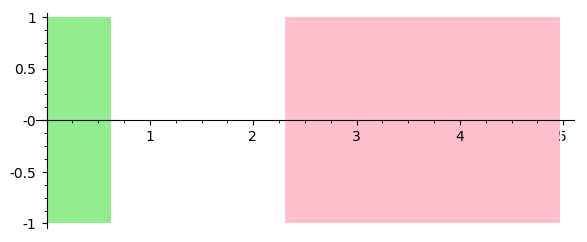

In [17]:
ctx_sig = F(RIF(0.1, 0.2), P).context_signal_for_system(
    vf, v3, 5, order=5, step=(0.01, 0.2),
    precondition=1,
    estimation=1e-3,
    integrationScheme=2,
    cutoff_threshold=1e-5,
    symbolic_composition=True,
    use_masks=True,
)
ctx_sig.signal.plot()

self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2f7725c0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] *

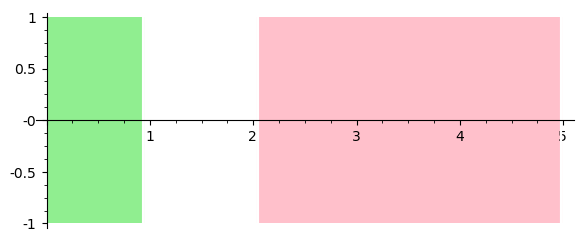

In [18]:
ctx_sig.refined_signal(1).plot()

self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2f7725c0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] *

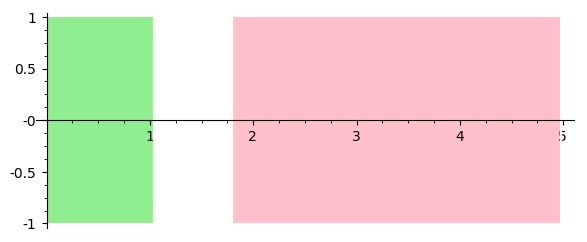

In [19]:
ctx_sig.refined_signal(2).plot()

self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2f7725c0>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] *

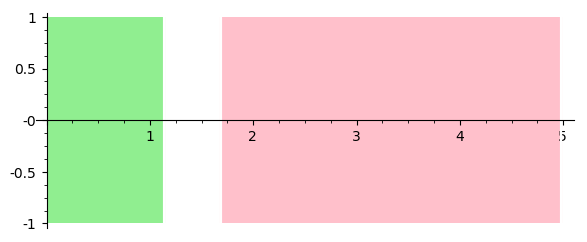

In [20]:
ctx_sig.refined_signal(3).plot()

calling reach with y0 = ['[1.0000000000000000 .. 1.2000000000000000]', '[4.0000000000000000 .. 6.0000000000000000]']
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [1.0..1.2]
C = [4.0..6.0]
contexts = ['[1.0..1.2]', '[4.0..6.0]']
statics  = []
Computed 115 flowpipes in 6.198883056640625e-06 sec
PolyObserver(x - 1.1500000000000000?, <flowstar.reachability.Reach object at 0x55fd2ed5a2f0>, 0.29999999999999999?*x^2*y - 0.59999999999999998?*x^2 - 0.2400000000000000?*x*y + 0.59999999999999998?*x symbolic_composition=True, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x))'
var_names = [b'local_t', b'x', b'y']
res = b'(([0.5999999999 , 0.6000000000] * x) + ([-0.2400000001 , -0.2399999999] * x * y) + ([-0.6000000000 , -0.5999999999] * x^2) + ([0.2999999999 , 0.3000000000] * x^2 * y))'
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000]

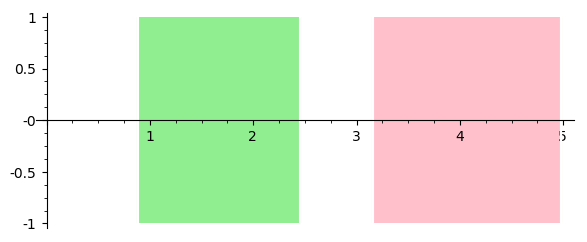

In [21]:
ctx_sig = Atomic(x - 1.15).context_signal_for_system(
    vf, v3, 5, order=5, step=(0.01, 0.5),
    precondition=1,
    estimation=1e-3,
    integrationScheme=2,
    cutoff_threshold=1e-5,
    symbolic_composition=True,
    use_masks=True,
)
ctx_sig.signal.plot()

In [22]:
prop = (F(RIF(0.1, 0.2), P) & Atomic(x - 1.15))
prop

And([F([0.10000000000000000 .. 0.20000000000000002], Atomic(x^2 + y^2 - 2.00000000000000*x + 0.800000000000000)), Atomic(x - 1.15000000000000)])

calling reach with y0 = ['[1.0000000000000000 .. 1.2000000000000000]', '[4.0000000000000000 .. 6.0000000000000000]']
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [1.0..1.2]
C = [4.0..6.0]
contexts = ['[1.0..1.2]', '[4.0..6.0]']
statics  = []
Computed 116 flowpipes in 7.3909759521484375e-06 sec
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd2fad2d00>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=True, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.20

/usr/lib64/python3.7/site-packages/matplotlib/contour.py:1243: UserWarning: No contour levels were found within the data range.
  warnings.warn("No contour levels were found"


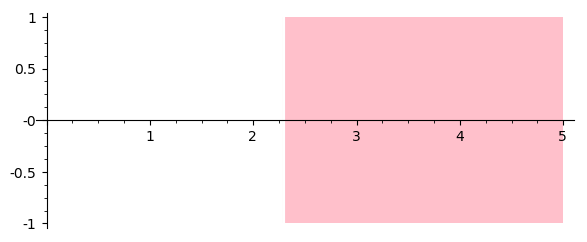

In [23]:
ctx_sig = prop.context_signal_for_system(
    vf, v3, 5, order=5, step=(0.01, 0.5),
    precondition=1,
    estimation=1e-3,
    integrationScheme=2,
    cutoff_threshold=1e-5,
    symbolic_composition=True,
    use_masks=True,
)
ctx_sig.signal.plot()

self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] *

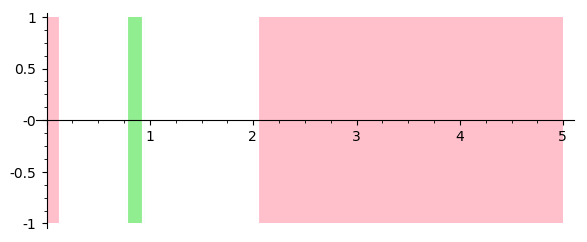

In [24]:
ctx_sig.refined_signal(1).plot()

In [25]:
sig = ctx_sig.refined_signal(2)

self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] *

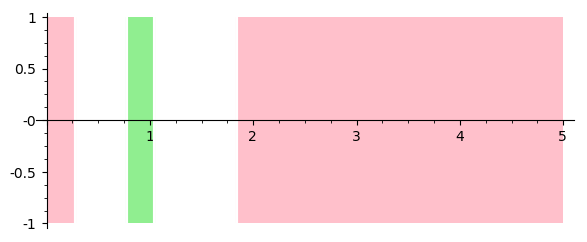

In [26]:
sig.plot()

In [27]:
sig = ctx_sig.refined_signal(3)

self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] *

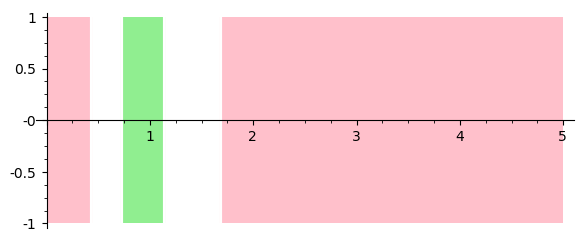

In [28]:
sig.plot()

In [30]:
sig = ctx_sig.refined_signal(4)

self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] *

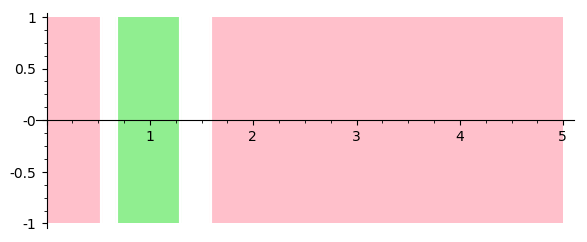

In [31]:
sig.plot()

In [32]:
sig = ctx_sig.refined_signal(5)

self.reach.vars = [x, y]
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] * y^2) + ([0.4799999999 , 0.4800000001] * x * y) + ([2.3999999999 , 2.4000000000] * x^2) + ([-0.1000000001 , -0.1000000000] * y^3) + ([3.2000000000 , 3.2000000001] * x * y^2) + ([-1.0800000001 , -1.0799999999] * x^2 * y) + ([-1.2000000000 , -1.1999999999] * x^3) + ([-4.0000000000 , -4.0000000000] * x^2 * y^2) + ([0.5999999999 , 0.6000000000] * x^3 * y))'
PolyObserver((([0.8000000000 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x) + ([1.0000000000 , 1.0000000000] * y^2) + ([1.0000000000 , 1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x55fd2fad2d00>, (([-1.2000000000 , -1.1999999999] * x) + ([-0.1000000001 , -0.1000000000] *

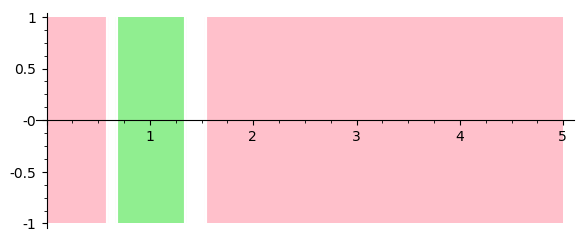

In [33]:
sig.plot()

### Polynomial plot

In [34]:
p + reach.sage_interval_plot('x', 'y',
                             poly=(x - 1)^2 + y^2 - 0.2,
                             aspect_ratio='automatic')

NameError: name 'reach' is not defined

## Context

In [35]:
kwargs = dict(
    order=5, step=(0.01, 0.5),
    precondition=1,
    estimation=1e-3,
    integrationScheme=2,
    cutoff_threshold=1e-5,
    verbosity=0,
    epsilon_ctx=0.1,
#    symbolic_composition=True,
)
args = (vf, v3, 7)

In [36]:
{x: RIF(0.05,0.1)} >> G(RIF(0,0.2), P)

C({x: [0.050000000000000002 .. 0.10000000000000001]}, G([0.0000000000000000 .. 0.20000000000000002], Atomic(x^2 + y^2 - 2.00000000000000*x + 0.800000000000000)))

In [37]:
sig = ({x: RIF(0.05,0.1)} >> G(RIF(0,0.2), P)
       ).signal_for_system(vf, v3, 10, **kwargs)

Precomposed systems in 4.291534423828125e-05 sec
calling reach with y0 = ['[1.0000000000000000 .. 1.2000000000000000]', '[4.0000000000000000 .. 6.0000000000000000]']
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [1.0..1.2]
C = [4.0..6.0]
Computed 143 flowpipes in 1.2997393608093262 sec
mask = None
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[0.99863734049121122 .. 1.5959882046269048]'), ('None', '[-0.18566626515230495 .. 6.0001133420806650]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [0.9986373404912112..1.5959882046269047]
S = [-0.18566626515230494..6.000113342080665]
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[0.99998486618648119 .. 1.5959882046269048]'), ('None', '[-0.18566626515230495 .. 6.0001133420806650]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [0.9999848661864812..1.5959882046269047]
S = [-0.18566626515230494..

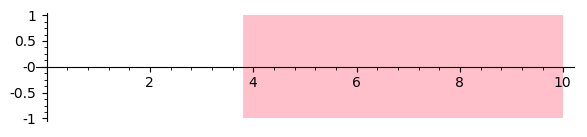

In [38]:
sig.plot()

In [39]:
sigM = ({x: RIF(0.05,0.1)} >> G(RIF(0,0.2), P)
       ).signal_for_system(vf, v3, 10, use_masks=True, **kwargs)
sigM

Precomposed systems in 2.5272369384765625e-05 sec
calling reach with y0 = ['[1.0000000000000000 .. 1.2000000000000000]', '[4.0000000000000000 .. 6.0000000000000000]']
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [1.0..1.2]
C = [4.0..6.0]
Computed 143 flowpipes in 1.269620656967163 sec
mask = Mask([0.0000000000000000 .. 10.001000000000002], [[0.0000000000000000 .. 10.001000000000002]])
mask = Mask([0.0000000000000000 .. 10.001000000000002], [[0.0000000000000000 .. 10.001000000000002]])
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[0.99863734049121122 .. 1.5959882046269048]'), ('None', '[-0.18566626515230495 .. 6.0001133420806650]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [0.9986373404912112..1.5959882046269047]
S = [-0.18566626515230494..6.000113342080665]
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[0.99998486618648119 .. 1.5959882046269048]'), ('None', '[-0.18

Signal([0.0000000000000000 .. 10.000000000000000], [([0.0000000000000000 .. 0.078132812500000010], True), ([3.8285078125000007 .. 10.000000000000000], False)], mask=Mask([0.0000000000000000 .. 10.000000000000000], [[0.0000000000000000 .. 10.000000000000000]]))

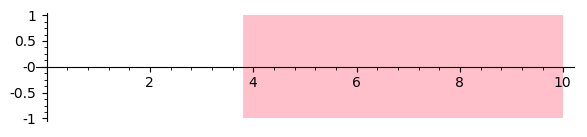

In [40]:
sigM.plot()

In [41]:
sigM.mask

Mask([0.0000000000000000 .. 10.000000000000000], [[0.0000000000000000 .. 10.000000000000000]])

In [42]:
%%time
sigG = G(RIF(10.2, 10.3), ({x: RIF(0.05,0.1)} >> G(RIF(0,0.2), P)),
         ).signal_for_system(vf, v3, 0, **kwargs)

Precomposed systems in 3.075599670410156e-05 sec
calling reach with y0 = ['[1.0000000000000000 .. 1.2000000000000000]', '[4.0000000000000000 .. 6.0000000000000000]']
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [1.0..1.2]
C = [4.0..6.0]
Computed 145 flowpipes in 1.274183988571167 sec
In G.signal
mask = None
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[0.99863734049121122 .. 1.5959882046269048]'), ('None', '[-0.18566626515230495 .. 6.0001133420806650]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [0.9986373404912112..1.5959882046269047]
S = [-0.18566626515230494..6.000113342080665]
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[0.99998486618648119 .. 1.5959882046269048]'), ('None', '[-0.18566626515230495 .. 6.0001133420806650]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [0.9999848661864812..1.5959882046269047]
S = [-0.18566626

In [43]:
sigG(0)

False

In [44]:
%%time
sigG = G(RIF(10.2, 10.3), ({x: RIF(0.05,0.1)} >> G(RIF(0,0.2), P)),
         ).signal_for_system(vf, v3, 0, use_masks=True, **kwargs)

Precomposed systems in 3.790855407714844e-05 sec
calling reach with y0 = ['[1.0000000000000000 .. 1.2000000000000000]', '[4.0000000000000000 .. 6.0000000000000000]']
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [1.0..1.2]
C = [4.0..6.0]
Computed 145 flowpipes in 1.2488174438476562 sec
In G.signal
mask = Mask([0.0000000000000000 .. 10.301000000000002], [[10.199999999999999 .. 10.301000000000002]])
mask = Mask([0.0000000000000000 .. 10.301000000000002], [[10.199999999999999 .. 10.301000000000002]])
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[0.99904786189732996 .. 1.0056246182309452]'), ('None', '[-0.0062191321833736432 .. 0.010711199615616205]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [0.99904786189733..1.0056246182309452]
S = [-0.006219132183373643..0.010711199615616205]
Computed 2 flowpipes in 0.02305150032043457 sec
In G.signal
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowsta

In [45]:
%%time
sigG = F(RIF(5, 5.1),
         {y: RIF(1, 1.5)} >>
         G(RIF(10.2, 10.3),
           {x: RIF(0.05,0.1)} >>
            G(RIF(0,0.2), P)),
         ).signal_for_system(vf, v3, 0, **kwargs)

Precomposed systems in 5.7697296142578125e-05 sec
calling reach with y0 = ['[1.0000000000000000 .. 1.2000000000000000]', '[4.0000000000000000 .. 6.0000000000000000]']
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [1.0..1.2]
C = [4.0..6.0]
Computed 115 flowpipes in 1.1523358821868896 sec
mask = None
calling reach with y0 = [('None', '[0.99998486618648119 .. 1.5959882046269048]'), ('[1.0000000000000000 .. 1.5000000000000000]', '[-0.18566626515230495 .. 6.0001133420806650]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
S = [0.9999848661864812..1.5959882046269047]
C = [1.0..1.5]
S = [-0.18566626515230494..6.000113342080665]
calling reach with y0 = [('None', '[0.99998486618648119 .. 1.5959882046269048]'), ('[1.0000000000000000 .. 1.5000000000000000]', '[-0.18566626515230495 .. 6.0001133420806650]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
S = [0.9999848661864812..1.5959882046269047]
C = [1.0..1.5]
S = [-0.18566626515230494..6.00011

In [46]:
%%time
sigG = F(RIF(5, 5.1),
         {y: RIF(1, 1.5)} >>
         G(RIF(10.2, 10.3),
           {x: RIF(0.05,0.1)} >>
            G(RIF(0,0.2), P)),
         ).signal_for_system(vf, v3, 0, use_masks=True, **kwargs)

Precomposed systems in 5.984306335449219e-05 sec
calling reach with y0 = ['[1.0000000000000000 .. 1.2000000000000000]', '[4.0000000000000000 .. 6.0000000000000000]']
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [1.0..1.2]
C = [4.0..6.0]
Computed 115 flowpipes in 1.1289350986480713 sec
mask = Mask([0.0000000000000000 .. 5.1010000000000000], [[5.0000000000000000 .. 5.1010000000000000]])
mask = Mask([0.0000000000000000 .. 5.1010000000000000], [[5.0000000000000000 .. 5.1010000000000000]])
calling reach with y0 = [('None', '[1.0112939853473539 .. 1.0714799218102973]'), ('[1.0000000000000000 .. 1.5000000000000000]', '[-0.055341024645701252 .. 0.11024717083180576]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
S = [1.011293985347354..1.0714799218102973]
C = [1.0..1.5]
S = [-0.05534102464570125..0.11024717083180575]
Computed 70 flowpipes in 0.41150879859924316 sec
In G.signal
mask = Mask([0.0000000000000000 .. 10.302000000000002], [[10.199999999999999 .. 

In [47]:
%%time
sigG = G(RIF(2, 2.5),
         {x: RIF(0.1, 0.2)} >>
         F(RIF(5, 5.1),
           {y: RIF(1, 1.5)} >>
           G(RIF(10.2, 10.3),
             {x: RIF(0.05,0.1)} >>
             G(RIF(0,0.2), P))),
         ).signal_for_system(vf, v3, 0, **kwargs)

Precomposed systems in 5.984306335449219e-05 sec
calling reach with y0 = ['[1.0000000000000000 .. 1.2000000000000000]', '[4.0000000000000000 .. 6.0000000000000000]']
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [1.0..1.2]
C = [4.0..6.0]
Computed 92 flowpipes in 0.9122421741485596 sec
In G.signal
mask = None
calling reach with y0 = [('[0.10000000000000000 .. 0.20000000000000002]', '[0.99998486618648119 .. 1.5959882046269048]'), ('None', '[-0.18566626515230495 .. 6.0001133420806650]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.1..0.2]
S = [0.9999848661864812..1.5959882046269047]
S = [-0.18566626515230494..6.000113342080665]
calling reach with y0 = [('[0.10000000000000000 .. 0.20000000000000002]', '[0.99998486618648119 .. 1.5959882046269048]'), ('None', '[0.061157558039720075 .. 6.0001133420806650]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.1..0.2]
S = [0.9999848661864812..1.5959882046269047]
S = [0.0611575580397

In [48]:
%%time
sigG = G(RIF(2, 2.5),
         {x: RIF(0.1, 0.2)} >>
         F(RIF(5, 5.1),
           {y: RIF(1, 1.5)} >>
           G(RIF(10.2, 10.3),
             {x: RIF(0.05,0.1)} >>
             G(RIF(0,0.2), P))),
         ).signal_for_system(vf, v3, 0, use_masks=True, **kwargs)

Precomposed systems in 4.887580871582031e-05 sec
calling reach with y0 = ['[1.0000000000000000 .. 1.2000000000000000]', '[4.0000000000000000 .. 6.0000000000000000]']
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [1.0..1.2]
C = [4.0..6.0]
Computed 92 flowpipes in 1.1172966957092285 sec
In G.signal
mask = Mask([0.0000000000000000 .. 2.5010000000000004], [[2.0000000000000000 .. 2.5010000000000004]])
mask = Mask([0.0000000000000000 .. 2.5010000000000004], [[2.0000000000000000 .. 2.5010000000000004]])
calling reach with y0 = [('[0.10000000000000000 .. 0.20000000000000002]', '[1.1024292680261309 .. 1.3432583110108876]'), ('None', '[-0.17123410778533238 .. 0.71938507293036880]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.1..0.2]
S = [1.102429268026131..1.3432583110108876]
S = [-0.17123410778533238..0.7193850729303688]
Computed 56 flowpipes in 0.557999849319458 sec
mask = Mask([0.0000000000000000 .. 5.1020000000000004], [[5.0000000000000000 .. 5.1

In [49]:
sigG(0)

False

In [51]:
sigG

Signal([0.0000000000000000 .. -0.0000000000000000], [([0.0000000000000000 .. -0.0000000000000000], False)], mask=Mask([0.0000000000000000 .. -0.0000000000000000], [[0.0000000000000000 .. -0.0000000000000000]]))

In [54]:
sigG = G(RIF(2, 2.5),
         {x: RIF(0.1, 0.2)} >>
         F(RIF(5, 5.1),
           {y: RIF(1, 1.5)} >>
           G(RIF(10.2, 10.3),
             {x: RIF(0.05,0.1)} >>
             G(RIF(0,0.2), P))),
         ).signal_for_system(vf, v3, 10, use_masks=True, **kwargs)

Precomposed systems in 4.673004150390625e-05 sec
calling reach with y0 = ['[1.0000000000000000 .. 1.2000000000000000]', '[4.0000000000000000 .. 6.0000000000000000]']
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [1.0..1.2]
C = [4.0..6.0]
Computed 155 flowpipes in 1.3312880992889404 sec
In G.signal
mask = Mask([0.0000000000000000 .. 12.501000000000002], [[2.0000000000000000 .. 12.501000000000002]])
mask = Mask([0.0000000000000000 .. 12.501000000000002], [[2.0000000000000000 .. 12.501000000000002]])
calling reach with y0 = [('[0.10000000000000000 .. 0.20000000000000002]', '[0.99863734049121122 .. 1.3432583110108876]'), ('None', '[-0.17123410778533238 .. 0.71938507293036880]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.1..0.2]
S = [0.9986373404912112..1.3432583110108876]
S = [-0.17123410778533238..0.7193850729303688]
Computed 63 flowpipes in 0.5722329616546631 sec
mask = Mask([0.0000000000000000 .. 5.1020000000000004], [[5.0000000000000000 ..

/usr/lib64/python3.7/site-packages/matplotlib/contour.py:1243: UserWarning: No contour levels were found within the data range.
  warnings.warn("No contour levels were found"


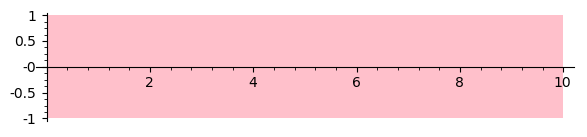

In [55]:
sigG.plot()

## Context signal (masked)

In [63]:
sigG = G(RIF(1, 1.1), ({x: RIF(0.05,0.1)} >> G(RIF(0,0.2), P)),
         ).signal_for_system(vf, v3, 10, use_masks=True, **kwargs)

Precomposed systems in 2.7894973754882812e-05 sec
calling reach with y0 = ['[1.0000000000000000 .. 1.2000000000000000]', '[4.0000000000000000 .. 6.0000000000000000]']
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [1.0..1.2]
C = [4.0..6.0]
Computed 148 flowpipes in 1.2379133701324463 sec
In G.signal
mask = Mask([0.0000000000000000 .. 11.101000000000003], [[1.0000000000000000 .. 11.101000000000003]])
mask = Mask([0.0000000000000000 .. 11.101000000000003], [[1.0000000000000000 .. 11.101000000000003]])
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[0.99863734049121122 .. 1.5727943631722219]'), ('None', '[-0.18566626515230495 .. 2.0609029880732562]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [0.9986373404912112..1.5727943631722219]
S = [-0.18566626515230494..2.060902988073256]
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[1.0038105784554185 .. 1.5727943631722219]'), ('No

/usr/lib64/python3.7/site-packages/matplotlib/contour.py:1243: UserWarning: No contour levels were found within the data range.
  warnings.warn("No contour levels were found"


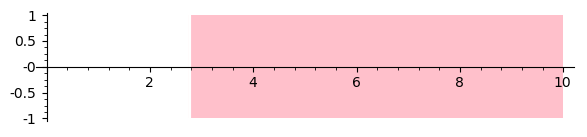

In [64]:
sigG.plot()

In [67]:
csigG = G(RIF(1, 1.1), ({x: RIF(0.05,0.1)} >> G(RIF(0,0.2), P)),
          ).context_signal_for_system(vf, v3, 10, use_masks=True, **kwargs)

calling reach with y0 = ['[1.0000000000000000 .. 1.2000000000000000]', '[4.0000000000000000 .. 6.0000000000000000]']
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [1.0..1.2]
C = [4.0..6.0]
contexts = ['[1.0..1.2]', '[4.0..6.0]']
statics  = []
Computed 148 flowpipes in 5.9604644775390625e-06 sec
mask = None
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[0.99863734049219643 .. 1.5959882046270193]'), ('None', '[-0.18566626515688304 .. 6.0001133420806659]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [0.9986373404921964..1.5959882046270193]
S = [-0.18566626515688303..6.000113342080666]
contexts = ['[0.05..0.1]']
statics  = ['[0.9986373404921964..1.5959882046270193]', '[-0.18566626515688303..6.000113342080666]']
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3ad9a9a0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?

/usr/lib64/python3.7/site-packages/matplotlib/contour.py:1243: UserWarning: No contour levels were found within the data range.
  warnings.warn("No contour levels were found"


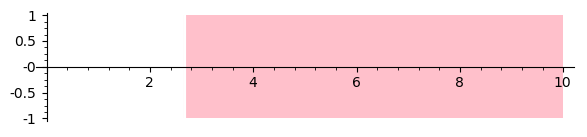

In [68]:
csigG.signal.plot()

mask = None
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[0.99938562762067362 .. 1.3844319636599350]'), ('None', '[-0.033154973963680647 .. 5.0001133420806659]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [0.9993856276206736..1.384431963659935]
S = [-0.033154973963680646..5.000113342080666]
contexts = ['[0.05..0.1]']
statics  = ['[0.9993856276206736..1.384431963659935]', '[-0.033154973963680646..5.000113342080666]']
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3a784170>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001])

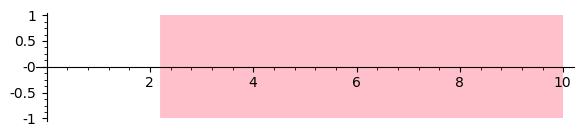

In [69]:
csigG.refined_signal(1).plot()

In [70]:
csigG = G(RIF(1, 1.1), ({x: RIF(0.05,0.1)} >> G(RIF(0,0.2), P)),
          ).context_signal_for_system(vf, v3, 10, use_masks=True, refine=1, **kwargs)

calling reach with y0 = ['[1.0000000000000000 .. 1.2000000000000000]', '[4.0000000000000000 .. 6.0000000000000000]']
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [1.0..1.2]
C = [4.0..6.0]
contexts = ['[1.0..1.2]', '[4.0..6.0]']
statics  = []
Computed 148 flowpipes in 1.33514404296875e-05 sec
mask = None
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[0.99863734049219643 .. 1.5959882046270193]'), ('None', '[-0.18566626515688304 .. 6.0001133420806659]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [0.9986373404921964..1.5959882046270193]
S = [-0.18566626515688303..6.000113342080666]
contexts = ['[0.05..0.1]']
statics  = ['[0.9986373404921964..1.5959882046270193]', '[-0.18566626515688303..6.000113342080666]']
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3c23ae60>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x

/usr/lib64/python3.7/site-packages/matplotlib/contour.py:1243: UserWarning: No contour levels were found within the data range.
  warnings.warn("No contour levels were found"


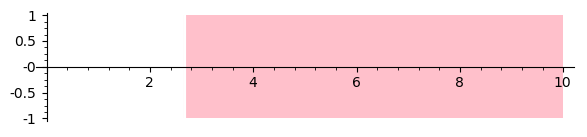

In [71]:
csigG.refined_signal(0).plot()

mask = None
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[0.99938562762067362 .. 1.3844319636599350]'), ('None', '[-0.033154973963680647 .. 5.0001133420806659]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [0.9993856276206736..1.384431963659935]
S = [-0.033154973963680646..5.000113342080666]
contexts = ['[0.05..0.1]']
statics  = ['[0.9993856276206736..1.384431963659935]', '[-0.033154973963680646..5.000113342080666]']
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3992e0f0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001])

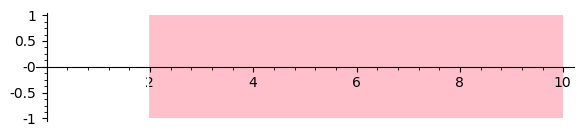

In [72]:
csigG.refined_signal(1).plot()

In [73]:
csigG = G(RIF(1, 1.1), ({x: RIF(0.05,0.1)} >> G(RIF(0,0.2), P)),
          ).context_signal_for_system(vf, v3, 10, use_masks=True, refine=2, **kwargs)

calling reach with y0 = ['[1.0000000000000000 .. 1.2000000000000000]', '[4.0000000000000000 .. 6.0000000000000000]']
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [1.0..1.2]
C = [4.0..6.0]
contexts = ['[1.0..1.2]', '[4.0..6.0]']
statics  = []
Computed 148 flowpipes in 5.7220458984375e-06 sec
mask = None
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[0.99863734049219643 .. 1.5959882046270193]'), ('None', '[-0.18566626515688304 .. 6.0001133420806659]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [0.9986373404921964..1.5959882046270193]
S = [-0.18566626515688303..6.000113342080666]
contexts = ['[0.05..0.1]']
statics  = ['[0.9986373404921964..1.5959882046270193]', '[-0.18566626515688303..6.000113342080666]']
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3d789c80>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^

/usr/lib64/python3.7/site-packages/matplotlib/contour.py:1243: UserWarning: No contour levels were found within the data range.
  warnings.warn("No contour levels were found"


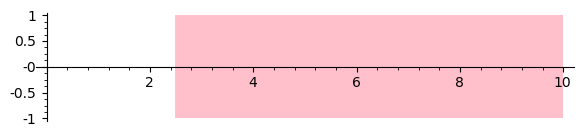

In [74]:
csigG.refined_signal(0).plot()

mask = None
calling reach with y0 = [('[0.050000000000000002 .. 0.10000000000000001]', '[0.99938562762067362 .. 1.3844319636599350]'), ('None', '[-0.033154973963680647 .. 5.0001133420806659]')]
ode in polynomial ring
_handle_initials called!
vars = [x, y]
C = [0.05..0.1]
S = [0.9993856276206736..1.384431963659935]
S = [-0.033154973963680646..5.000113342080666]
contexts = ['[0.05..0.1]']
statics  = ['[0.9993856276206736..1.384431963659935]', '[-0.033154973963680646..5.000113342080666]']
PolyObserver(x^2 + y^2 - 2*x + 0.80000000000000005?, <flowstar.reachability.Reach object at 0x55fd3dca04a0>, 0.59999999999999998?*x^3*y - 4*x^2*y^2 - 1.2000000000000000?*x^3 - 1.080000000000000?*x^2*y + 3.2000000000000002?*x*y^2 - 0.10000000000000001?*y^3 + 2.4000000000000000?*x^2 + 0.4800000000000000?*x*y - 0.10000000000000001?*y^2 - 1.2000000000000000?*x symbolic_composition=False, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([0.8000000000 , 0.8000000001])

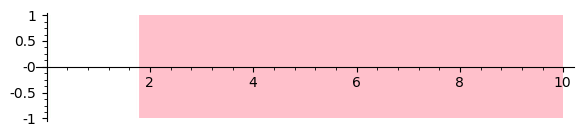

In [75]:
csigG.refined_signal(1).plot()

## Differential Context

In [ ]:
{x: RIF(6,7)} % G(RIF(0,0.2), P)

In [ ]:
# Use symbolic remainders for context jump 
kwargs['integrationScheme'] = 7

In [ ]:
kwargs['verbosity'] = 10

In [ ]:
kwargs['symbolic_composition'] = True

In [ ]:
sig = ({x: RIF(6)} % G(RIF(0,0.2), P)
       ).signal_for_system(vf, v3, 2*pi, **kwargs)

In [ ]:
sig.plot()

In [ ]:
sig = ({x: RIF(6, 6.1)} % G(RIF(0,0.2), P)
       ).signal_for_system(vf, v3, 2*pi, **kwargs)

In [ ]:
sig.plot()

In [ ]:
sig = ({x: RIF(10, 10.05)} % G(RIF(0,0.2), P)
       ).signal_for_system(vf, v3, 2*pi, **kwargs)

In [ ]:
sig.plot()

In [ ]:
{x: 1, y: 2}

In [ ]:
kxs = [[('x', RIF(1,2)), ('y', RIF(5,6))], [('x', RIF(2,3)), ('y', RIF(6,7))], [('x', RIF(1,2)), ('y', RIF(5,6))], [('x', RIF(2,3)), ('y', RIF(6,7))]]

In [ ]:
sorted(kxs)

In [ ]:
sorted(kxs,
       key=lambda xs: [(k, x.endpoints()) for k, x in xs])